## Resubmitting for formatting issues with the last two visualizations

# 1. What data do we have?

We have general questions including age, gender, year in college, student's major, and ethnicity, where they're from, and if they came here as a transfer student or not. Then we have more specific questions related to college life such as how many hours students spent doing homework, studying, how many lectures they have a week, how many of those lectures do they attend. Some more personal questions were asked as well such as what grade did students get in intro CS classes like 10A and 10B, what made them choose their major, if their parents work in a CS related role, what programming languages they knew before entering UCR, current GPA, etc.

# 2. What would you like to know?

Does CS experience before college affect how students do in their CS classes during college? We will be looking at multiple factors such as the AP CS/math classes they took before college, how many hours they spend studying(not including homework), gender, ethnicity, etc. 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import scipy.stats as stats
from scipy.stats import chi2_contingency 
from scipy.stats import chi2
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
from matplotlib.pyplot import pie, axis, show

# read in dataframe
df = pd.read_csv('fall22responses.csv')

# remove questions we don't want to analyze
df = df.drop(columns=["""4. What is your approximate height? (Ex: 5'0" - 5'5")""", '5. Do you wear prescription glasses or contacts?', '7. What generation immigrant are you?', '8. How many siblings do you have?', '9. What birth order are you? (1 being the oldest)', '10. How many languages do you know?', 
                      '11. How many of those languages (above) do you use to speak with friends?', '12. How many languages did you grow up speaking with your family?', '18. How many units are you taking currently?', '19. How many units have you taken so far at UCR?', 
                      '20. What class is making you fill out this survey?', '22. Were you formally educated in a non-English language at any point?', '23. How do you feel about your college experience so far?', 
                      '29. What is your preferred area of Computer Science?', '30. Which area of Computer Science are you interested in working in the future?', '31. Which generation college student are you?', '32. What is the highest education held by your parent(s)?', '35. What is your preferred tool for note-taking?', 
                      '36. How often do you take notes in lecture?','39. How does participating in lecture make you feel?', '40. Why you feel this way about the previous question? (Select all that apply) ', '41. How close do you sit to the front of class?', '42. How many times a week do you attend office hours on average?', 
                      '45. How many internship/job offers have you received, and at which times (i.e. 2 offers in Fall 2021, 3 offers in Summer 2022) N/A if no offers yet.', '46. Do you currently have a job?', '47. Do you work on or off campus?', '48. Are you a grader or a research assistant?', 
                      '49. How many hours in a typical week do you work?', '50. Do you receive financial aid?  (scholarships, grants, etc) ', '51. Do you take out student loans?', "52. What is your family's annual income?", "53. What's your desired starting total compensation out of college?($ amount)", '54. What is your current living situation?', '55. How do you commute to school?', 
                      '56. Do you have a UCR dining plan?', '57. How many times a week do you purchase food or drinks from somewhere on campus?', '58. What items do you purchase?', '59. What is the biggest reason you do not purchase more food and drinks on campus?', '60. How many extracurricular activities do you partake in? (Clubs/Fraternities, Teams, Sports, Jobs).', 
                      '61. If you take part in extracurricular activities, how many of them are specific to BCOE?', '62. How many clubs are you part of?', '63. How many of those are academic clubs?', '64. How many hours per week do you spend on club work on average?', '65. Do you have an officer position within a club?', '66. Which sports have you played in a formal team?(Select all that apply)', 
                      '67. How would you describe yourself?', '68. How many hours do you spend on on-screen entertainment per week on average?', '69. How many social media platforms are you currently active on?', '70. How often do you post on social media per week?', '71. How many hours a week do you actively spend on social media?', '72. How do you feel after using social media?',
                     '73. How many hours do you spend streaming videos in an average week? (YouTube, Netflix...)', '74. How many hours do you play video games in an average week? (PC, console, phone...)', '75. How many hours do you spend watching gaming streams in a week?', '76. What genre of games do you play? (Select all that apply)', '77. What is the name of the game you play most?',
                     '78. Are you a member of any professional social media sites? (ex: linkedin/glassdoor)', '79. From the people that you have met on campus, how many hours per week do you socialize with them outside of class? (i.e. studying, eating, exercising, lounging, etc.)', '80. How do you feel you are doing this quarter?', '81. How many hours do you regularly sleep?', '82. How would you rate your stress level on a scale from 1 to 5?',
                     '83. Do you believe you have imposter syndrome?', '84. When was the last time an event caused you significant distress (feeling sad for at least a week)?', '85. What was your sadness caused by?', '86. Did you indulge in binging as a coping mechanism in any of these options?', '87. Did you seek comfort from your family or friends in sharing your pain?', 
                      '88. Based on your answer from the binging and friends and/or family questions, which do you think best helped to soothe your pain?', '89. What is your political affiliation?', '90. Stricter gun laws will reduce violence and deaths.', '91. Homeless individuals, that have refused available shelter or housing, should be allowed to sleep or encamp on public property.', '92. You are in favor of decriminalizing drug use.',
                     '93. Should the Supreme Court be reformed to include more seats?', '94. Should the supreme court be reformed to impose term limits on judges?', '95. Do you support a universal basic income program?', '96. Which of the following hobbies do you partake in? (Select all that apply)', '97. How many hours per week do you spend on hobbies during breaks? (assuming no internship)', '98. How many hours per week do you spend on hobbies during the quarter?',
                     "99. How many cups (8oz) of caffeine do you consume during your college day? (0 if you don't drink caffeine)", "100. How many cups (8oz) of caffeine do you consume during weekends on average? (0 if you don't drink caffeine)", '101. What is your preferred caffeinated beverage?', '102. Do you feel any physical side effects if you do not consume caffeine within a specific time?', 
                    '103. Does your caffeine intake increase when you have deadlines/assignments due/exams/midterms/finals? (If yes, specify the average number of cups 8oz added. If no, type 0)', '104. How many hours do you spend on news per week on average?(reading, watching TV, websites/apps, radio, etc.)', '105. What are the top 3 news categories you are most interested in? (In order) Business, Finance & Economics/ Entertainment, Art & Culture/ Computers, Science & Technology/ General News & Current Affairs(global or local)/Sports',
                     '106. Which operating system do you prefer?', '107. Have you played the following instruments outside of school? (Select all that apply)', '108. If you answered the previous question, how many years of experience do you have?', '109. What is your preferred shoe brand?', '110. What is your preferred fast food restaurant?', '111. What is your preferred phone brand?', '112. What is your preferred soda?', '113. What is your preferred music streaming application?',
                     "114. You're at one of your friends parties and it is getting past the time you told your parents you were going to stay. Do you:", '115. You are at a conference where you know nobody, what would you do?', '116. You have completed a project of which you are satisfied. However, your TA is not convinced and points out what they think is wrong. What is your initial reaction?', "117. If you don't know how to complete an assignment, what do you do first?"])

# rename columns
df = df.rename(columns={'1. What is your last name initial?Please select the appropriate range. (Ex: Smith = Option 3)': 'LastInitial', '2. What is your age?': 'Age'})
df = df.rename(columns={'3. What gender do you identify as?': 'Gender', '6. How would you best describe yourself?': 'Ethnicity'})
df = df.rename(columns={'13. Where are you from?': 'StudentOriginalLocation'})
df = df.rename(columns={'14. What year are you?': 'Year', '15. Are you a transfer student?': 'TransferStatus'})
df = df.rename(columns={'16. What is your major?': 'Major', '17. What is your approximate cumulative GPA as of Fall 2022?': 'GPA'})
df = df.rename(columns={'21. Did you take any Math/CS related AP courses in high school? Select all that apply.': 'APCourses'})
df = df.rename(columns={'25. Did you have any prior experience in Computer Science before starting college?': 'PriorExperience'})
df = df.rename(columns={'26. Did you know any of the following languages before coming into college? (Select all that apply)': 'CodingLanguagesBeforeCollege'})
df = df.rename(columns={'13. Where are you from?': 'StudentLocation'})
df = df.rename(columns={'27. What was your grade in CS010A (or equivalent)?': 'GradeCS010A', '28. What was your grade in CS010B (or equivalent)?': 'GradeCS010B'})
df = df.rename(columns={'34. Are either of your parents in a Computer Science related role?': 'IsParentsCompSci'})
df = df.rename(columns={'24. When did you decide to pursue a college degree?': 'WhenPursueCollege'})
df = df.rename(columns={'33. What made you choose your major?': 'MajorInfluence'})
df = df.rename(columns={'43. How many hours do you study per week on average (not including time spent doing homework)?': 'NonHomeworkStudyHours'})
df = df.rename(columns={'44. How many hours do you spend doing homework per week on average?': 'HomeworkHours'})
df = df.rename(columns={'37. How many lectures do you have per week?' : 'LecPerWeek'})
df = df.rename(columns={'38. How many lectures do you attend per week on average?' : 'LecAttend'})

# clean data
df['Major'] = df['Major'].replace(['Data science'], 'DTSE')
df['Major'] = df['Major'].replace(['computer science'], 'ENCS')
df['Major'] = df['Major'].replace(['Computer Science'], 'ENCS')
df['Major'] = df['Major'].replace(['Computer science'], 'ENCS')
df['Major'] = df['Major'].replace(['data science'], 'DTSE')
df['Major'] = df['Major'].replace(['Data science'], 'DTSE')
df['Major'] = df['Major'].replace(['Data Science'], 'DTSE')
df['Major'] = df['Major'].replace(['CS'], 'ENCS')
df['Major'] = df['Major'].replace(['Computer Science with Business Applications'], 'CSBA')
df['Major'] = df['Major'].replace(['Cs'], 'ENCS')
df['Major'] = df['Major'].replace(['currently undeclared but filled out change of major request form beginning of this quarter'], 'Undeclared')
df['Major'] = df['Major'].replace(['cs major'], 'ENCS')
df['Major'] = df['Major'].replace(['Computer Engineering'], 'CEN')
df['Major'] = df['Major'].replace(['computer science with business applications'], 'CSBA')
df['Major'] = df['Major'].replace(['cs major'], 'ENCS')
df['Major'] = df['Major'].replace(['Computer Science BS'], 'ENCS')

df['APCourses'] = df['APCourses'].replace(['NONE'], 'No')
df['APCourses'] = df['APCourses'].replace(['AP Comp Sci A, French, environmental science, government, english'], 'AP Comp Sci A')
df['APCourses'] = df['APCourses'].replace(['N/A'], 'No')
df['APCourses'] = df['APCourses'].replace(['n/a'], 'No')
df['APCourses'] = df['APCourses'].replace(['International high school outside us'], 'No')
df['APCourses'] = df['APCourses'].replace(['none'], 'No')
df['APCourses'] = df['APCourses'].replace(['no'], 'No')

df['CodingLanguagesBeforeCollege'] = df['CodingLanguagesBeforeCollege'].replace(['NO'], 'No')
df['CodingLanguagesBeforeCollege'] = df['CodingLanguagesBeforeCollege'].replace(['N/A'], 'No')
df['CodingLanguagesBeforeCollege'] = df['CodingLanguagesBeforeCollege'].replace(['n/a'], 'No')
df['CodingLanguagesBeforeCollege'] = df['CodingLanguagesBeforeCollege'].replace(['None'], 'No')
df['CodingLanguagesBeforeCollege'] = df['CodingLanguagesBeforeCollege'].replace(['none'], 'No')
df['CodingLanguagesBeforeCollege'] = df['CodingLanguagesBeforeCollege'].replace(['No'], 'No')

df['MajorInfluence'] = df['MajorInfluence'].replace(['CS was too competitive of a field and data science was cool'], 'Passion')

df['NonHomeworkStudyHours'] = df['NonHomeworkStudyHours'].replace(['4-Mar'], '3')
df['NonHomeworkStudyHours'] = df['NonHomeworkStudyHours'].replace(['20-25'], '20')
df['NonHomeworkStudyHours'] = df['NonHomeworkStudyHours'].replace(['3-4'], '3')

df['HomeworkHours'] = df['HomeworkHours'].replace(['8-Jun'], '6')
df['HomeworkHours'] = df['HomeworkHours'].replace(['10-Aug'], '8')

df['LecAttend'] = df['LecAttend'].replace(['all'], '6')

In [2]:
df.loc[:, "NonHomeworkStudyHours" : "HomeworkHours"] = df.loc[:, "NonHomeworkStudyHours": "HomeworkHours"].fillna(0)
df

,Timestamp,LastInitial,Age,Gender,Ethnicity,StudentOriginalLocation,Year,TransferStatus,Major,GPA,...,PriorExperience,CodingLanguagesBeforeCollege,GradeCS010A,GradeCS010B,MajorInfluence,IsParentsCompSci,LecPerWeek,LecAttend,NonHomeworkStudyHours,HomeworkHours
0,11/3/22 1:35,S-Z,22,Male,Asian,Southern California,Senior,Yes,DTSE,3.0 - 3.49,...,No,No,A,C,Passion,No,8.0,4,5,5
1,11/3/22 8:15,A-I,22,Female,Asian,International,Junior,Yes,ENCS,3.0 - 3.49,...,Yes,C++,B,B,Passion,No,9.0,9,1,2
2,11/3/22 8:33,J-R,27,Male,White,Southern California,Senior,Yes,CSBA,3.5 - 4.0,...,Yes,"C++, Java, HTML/CSS",A,A,Passion,No,8.0,7,1,4
3,11/3/22 8:39,J-R,24,Male,Asian,Southern California,Senior,Yes,ENCS,3.5 - 4.0,...,Yes,Java,A,A,Money,No,11.0,8,3,4
4,11/3/22 8:59,J-R,40,Female,White,Southern California,Junior,Yes,DTSE,0 - 1.49,...,No,C++,A,A,Status,No,6.0,3,20,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,11/9/22 8:49,S-Z,22,Male,Asian,Southern California,Senior,No,ENCS,2.5 - 2.99,...,No,NaN,A,A,"Passion, Money",No,10.0,8,15,15
100,11/9/22 9:36,J-R,22,Male,Mixed,Southern California,Senior,Yes,ENCS,3.5 - 4.0,...,Yes,Java,A,A,Money,Yes,11.0,7,15,15
101,11/9/22 9:42,J-R,24,Male,Asian,Northern California,Junior,Yes,DTSE,0 - 1.49,...,No,NaN,C,B,Passion,Yes,10.0,7,28,28
102,11/9/22 10:12,J-R,21,Non-binary/non-conforming,Asian,Southern California,Senior,No,ENCS,3.0 - 3.49,...,Yes,"Java, C#",A,B,"Passion, Money",No,7.0,4,3,5


# 3. Explore the data. (Generate statistics, perform visualizations)

In [3]:
priorexperience_gender = pd.crosstab(df['Gender'], df['PriorExperience'],normalize=True,margins=True)
priorexperience_gender

PriorExperience,No,Yes,All
Gender,,,
Female,0.158416,0.099010,0.257426
Male,0.336634,0.376238,0.712871
Non-binary/non-conforming,0.000000,0.029703,0.029703
All,0.495050,0.504950,1.000000


In [4]:
priorexp_gender = pd.crosstab(df['Gender'], df['PriorExperience'],normalize=True)
priorexp_gender.div(priorexp_gender.sum(axis=1),axis=0)

PriorExperience,No,Yes
Gender,,
Female,0.615385,0.384615
Male,0.472222,0.527778
Non-binary/non-conforming,0.000000,1.000000


<AxesSubplot:xlabel='PriorExperience', ylabel='Gender'>

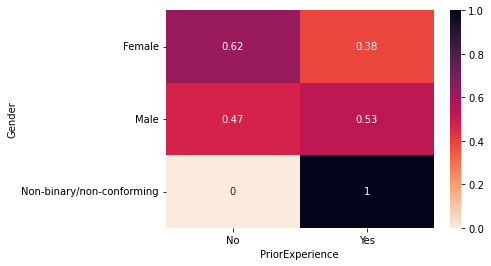

In [5]:
cmap = sns.cm.rocket_r
sns.heatmap(priorexp_gender.div(priorexp_gender.sum(axis=1),axis=0), annot=True, cmap=cmap)

The heatmap shows the gender of each individual along with the proportion of each gender who had prior CS experience prior to enrolling in college. We were able to determine which gender has the greatest prior experience along with how much greater their percentage was compared to the other genders. The inital question we wanted to know was if having prior CS experience was influenced by a person's gender.

PriorExperience,No,Yes
GPA,,
0 - 1.49,2,1
2.0 - 2.49,0,2
2.5 - 2.99,5,4
3.0 - 3.49,18,15
3.5 - 4.0,25,29


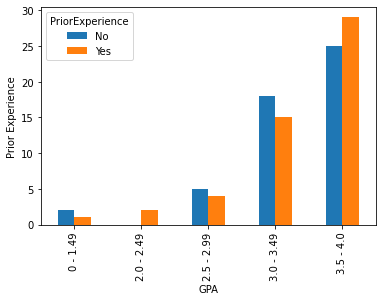

In [6]:
priorexp_GPA = pd.crosstab(df['GPA'], df['PriorExperience'])
priorexp_GPA.plot(kind='bar', xlabel="GPA", ylabel="Prior Experience")
priorexp_GPA

This bar graph displays a student's GPA range and whether they had any experience in CS prior to enrolling in college. We choose this graphic to depict this dataset because it allows us to clearly visualize if GPA and prior job experience have an influence on one another.

<AxesSubplot:ylabel='Parents in CS related role'>

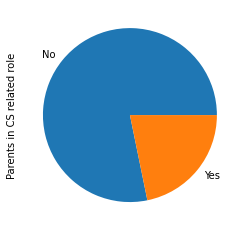

In [7]:
df['IsParentsCompSci'].value_counts().plot(kind='pie', ylabel="Parents in CS related role")

To show whether or not a student's parents work in CS, we used a pie chart. A pie chart's straightforward visual representation makes it simple to interpret. We can quickly see from the data that the majority of students' parents are not employed in the CS field.

MajorInfluence,Friends,Money,"Money, Wanted to try out and see if I liked",No other option,Parents,"Parents, Money","Parents, Money, Status","Parents, Passion","Parents, Passion, Money","Parents, Passion, Money, Status","Parents, Passion, Status",Passion,"Passion, Money","Passion, Money, Career Outlook","Passion, Money, Status","Passion, Status",Status
WhenPursueCollege,,,,,,,,,,,,,,,,,
1st/2nd year of High School,0.000000,0.066667,0.000000,0.000000,0.000000,0.066667,0.000000,0.000000,0.133333,0.000000,0.000000,0.333333,0.333333,0.000000,0.066667,0.000000,0.000000
3rd/4th year of High School,0.076923,0.230769,0.076923,0.000000,0.153846,0.076923,0.000000,0.000000,0.000000,0.000000,0.000000,0.076923,0.230769,0.000000,0.076923,0.000000,0.000000
After High School,0.000000,0.230769,0.000000,0.076923,0.000000,0.076923,0.076923,0.076923,0.076923,0.076923,0.000000,0.000000,0.076923,0.076923,0.000000,0.076923,0.076923
Middle School or earlier,0.000000,0.137931,0.000000,0.000000,0.051724,0.103448,0.000000,0.017241,0.155172,0.051724,0.017241,0.241379,0.189655,0.000000,0.017241,0.000000,0.017241


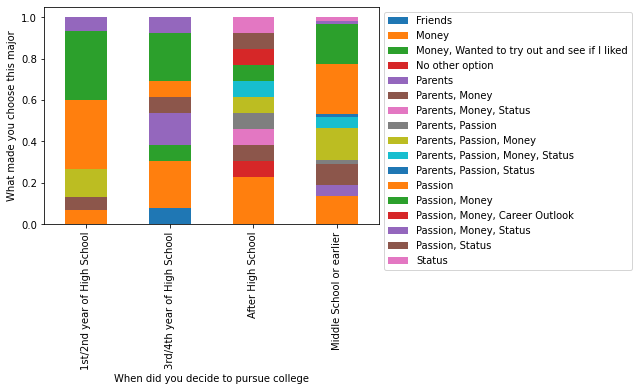

In [8]:
table = pd.crosstab(df.WhenPursueCollege, df.MajorInfluence, normalize="index")
display(table)
table.plot.bar(stacked=True, xlabel="When did you decide to pursue college", ylabel="What made you choose this major").legend(bbox_to_anchor=(1.0, 1.0))

We used a stacked bar graph to display when students deicded to attend college along with what made them choose their major.

<AxesSubplot:xlabel='Non Homework Study hours', ylabel='Lectures Attended per week'>

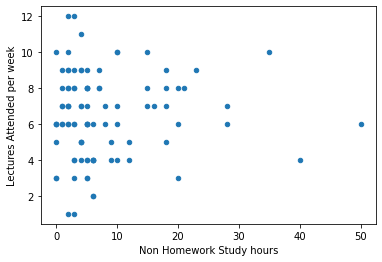

In [9]:
studyHomeworkHrs = df
studyHomeworkHrs.drop(df.index[df['NonHomeworkStudyHours'] == 0], inplace=True) 
df['NonHomeworkStudyHours'] = df['NonHomeworkStudyHours'].astype(int)
df['LecAttend'] = df['LecAttend'].astype(int)
studyHomeworkHrs.plot.scatter(x='NonHomeworkStudyHours',y='LecAttend', xlabel="Non Homework Study hours", ylabel="Lectures Attended per week")

This scatter plot displays the average number of lectures a student attends each week as well as the amount of time they spend studying aside from their homework. To check for a link between these two variables, we choose to utilize a scatter plot.

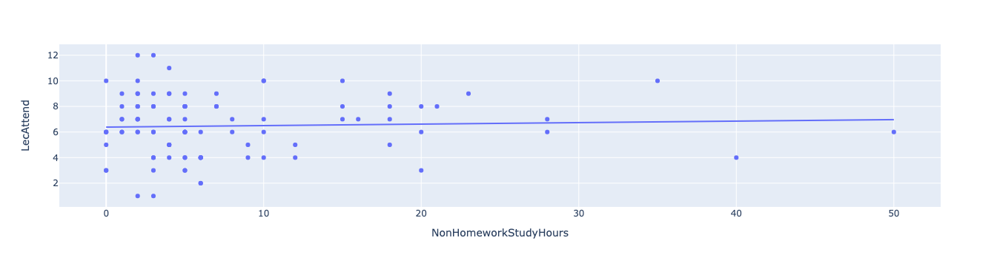

In [10]:
df['NonHomeworkStudyHours'] = df['NonHomeworkStudyHours'].astype(int)
df['LecAttend'] = df['LecAttend'].astype(float)
fig = px.scatter(df, x = 'NonHomeworkStudyHours', y = 'LecAttend', trendline = 'ols')
fig.show()

This plot shows the amount of lectures a student attended on average per week and the amount of time a student spends studying besides the time they spend on homework. We are able to see the OSL trendline which best fits our data. 

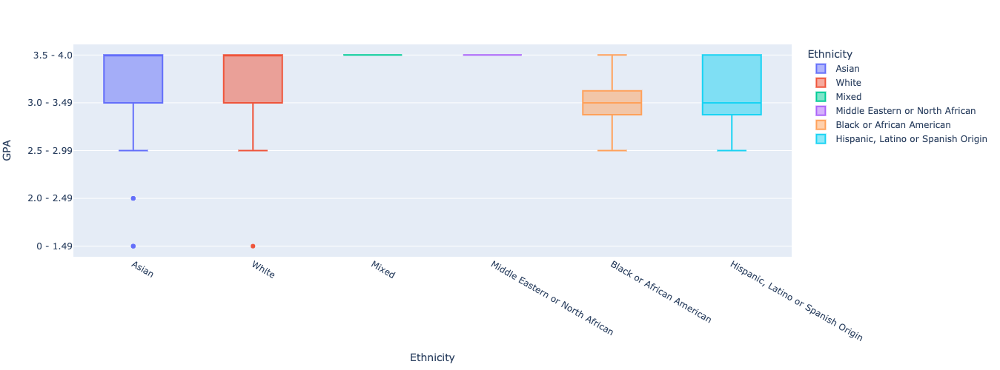

In [11]:
fig = px.box(df, x="Ethnicity", y="GPA", color="Ethnicity", width=1000, height=500) 
fig.update_yaxes(categoryorder='array', categoryarray=['0 - 1.49', '2.0 - 2.49', '2.5 - 2.99', '3.0 - 3.49', '3.5 - 4.0'])
fig.show()

This box plot displays the GPA and ethnicity of students. With this visualization our group was trying to see if ethnicity plays a role with a students GPA. One thing we have to keep in mind while looking at this visualization is 69% of students are Asian, 10% are White, 2% are mixed, 3% are Middle Eastern or North African, 5% are Black or African American, and 9% are Hispanic, Latino or of Spanish origin. We used a blox plot as a visualziation for this data because we are able to observe how tightly the data is grouped along with any outliers.

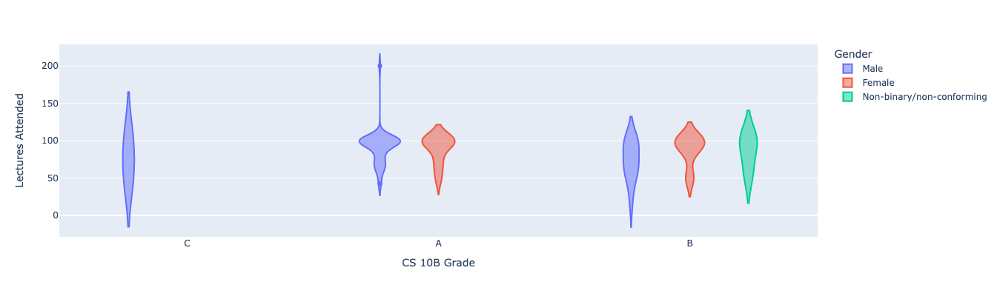

In [12]:
Lectures = df['LecAttend'].astype(float) / df['LecPerWeek'].astype(float) *100
Lectures 
fig = px.violin(df, y=Lectures, x="GradeCS010B", color="Gender",labels={"y" : "Lectures Attended", "GradeCS010B" : "CS 10B Grade"}, width=800, height=400)

fig.show()

With the help of our violin plot, we were able to see the distribution of both the average number of lectures each student attended each week and their CS 10B grade. We chose to use a violin plot to show the density because we had a lot of data. For each of our variables, we could see the IQR, mean, median, maximum, minimum, and an outlier. We also saw that a small number of highly attended lectures caused the mean to increase.

# 4. Can you state any hypotheses or make some predictions? Which tests can you apply to verify your hypothesis?

1. The null hypothesis is that prior CS experience before coming to college does not correlate with GPA. The alternative hypothesis is having prior CS experience before coming to college correlates to GPA. We can use chi-square test to verify our hypothesis. We predict the alternative hypothesis is correct

2. The null hypothesis is that having prior CS experience before coming to college does not correlate to one's gender. The alternative hypothesis is that having prior CS experience before coming to college correlates to a student's gender. We can use chi-square test to verify our hypothesis. We predict the null hypothesis is correct.

3. The null hypothesis is that having prior CS experience before coming to college does not correlate with student's race/ethnicity. The alternative hypothesis is that having prior CS experience before coming to college correlates with a student's ethnicity. We can use chi-square test to verify our hypothesis. We predict the null hypothesis is correct.

Chi-square value : 2.6859354413702237
P-value : 0.2610697357188685
Degrees of freedom : 2
Expected : [[34.25531915 35.74468085]
 [10.76595745 11.23404255]
 [ 0.9787234   1.0212766 ]]


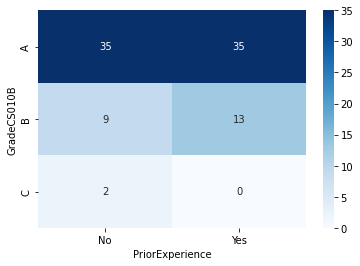

In [13]:
# first hypothesis
firstHyp = pd.crosstab(df.GradeCS010B, df.PriorExperience)
firstHyp

sns.heatmap(firstHyp, annot = True, cmap = "Blues")
c, p, dof, expected = chi2_contingency(firstHyp)

print(f'Chi-square value : {c}')
print(f'P-value : {p}')
print(f'Degrees of freedom : {dof}')
print(f'Expected : {expected}')

For our degrees of freedom we get 2. Our significance level is 0.26 but that value isn't on the table so we use the next closest value which is 0.25. In order for our alternative hypothesis to be accepted, X^2 value must be greater than 2.77. 2.685 is less than 2.77 which means our prediction that gpa is affected by prior experience a student has in computer science is not supported. Therefore our hypothesis is rejected.  

In [14]:
X2_1 = stats.chi2_contingency(firstHyp, correction=False)[0]
N_1 = np.sum(firstHyp)
min_dimension_1 = min(firstHyp.shape) - 1

cramerResult1 = np.sqrt((X2_1/N_1) / min_dimension_1)
cramerResult1

PriorExperience
No     0.241640
Yes    0.236552
dtype: float64

As we can see by the Cramer's V values, the results for both yes and no regarding prior experience is more or less equal to each other. Because these values are closer to 0, this indicates that there is little association between prior experience and the grade a student received in CS 10B.

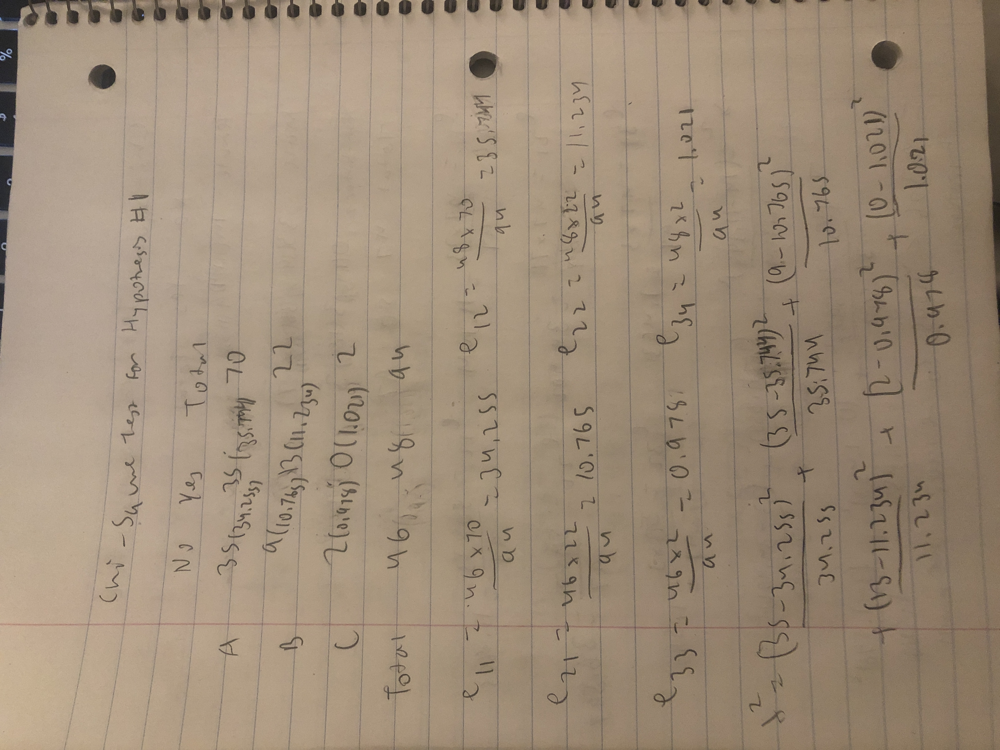

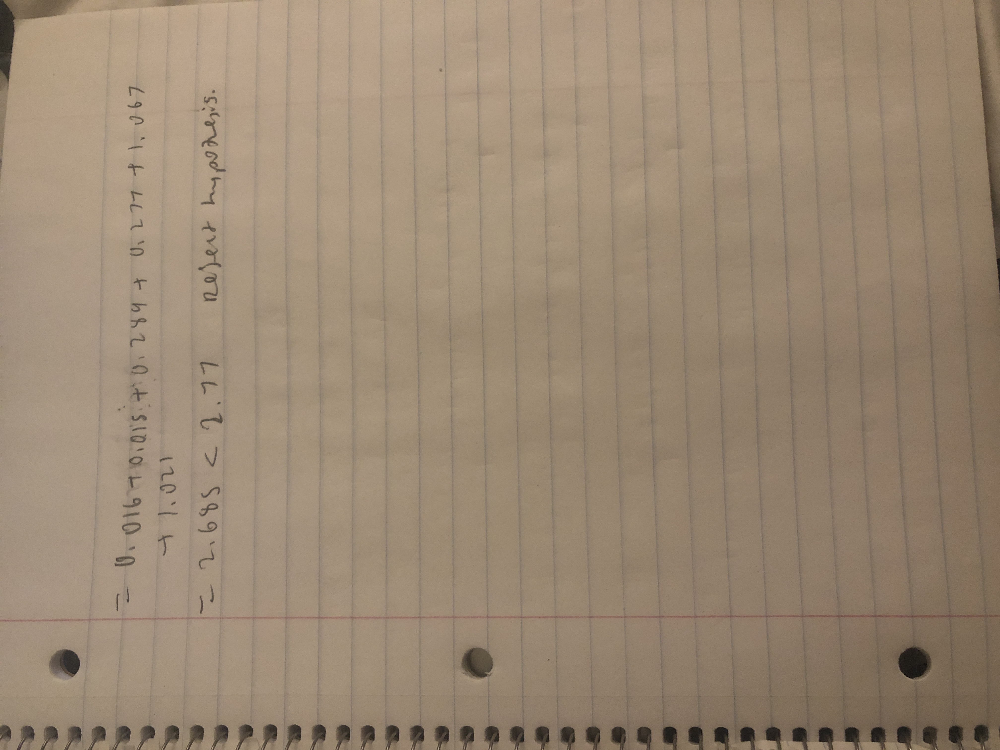

Chi-square value : 4.350447030006125
P-value : 0.1135827633816091
Degrees of freedom : 2
Expected : [[11.1443299  11.8556701 ]
 [34.40206186 36.59793814]
 [ 1.45360825  1.54639175]]


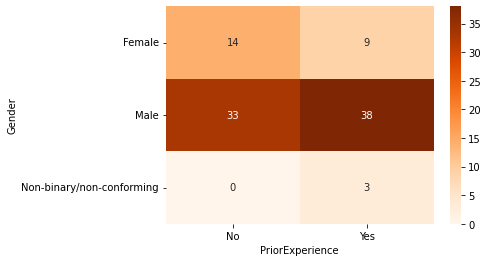

In [15]:
# second hypothesis
# df = pd.read_csv('fall22responses.csv')
# df = df.rename(columns={'3. What gender do you identify as?': 'Gender', '25. Did you have any prior experience in Computer Science before starting college?': 'PriorExperience'})
# corr = np.corrcoef(df['Gender'], df['PriorExperience'])
# print(corr)

secondHyp = pd.crosstab(df.Gender, df.PriorExperience)
sns.heatmap(secondHyp, annot = True, cmap = "Oranges")
c, p, dof, expected = chi2_contingency(secondHyp)

print(f'Chi-square value : {c}')
print(f'P-value : {p}')
print(f'Degrees of freedom : {dof}')
print(f'Expected : {expected}')

For our degrees of freedom we get 2. Our significance level, or p-value is 0.1 which means that in order for the null hypothesis to be rejected, X^2 value must be greater than 4.605. 4.350 < 4.605 so we accept the null hypothesis. We can conclude that prior experience with computer science is independent of one's gender. This supports our second hypothesis.

In [16]:
X2_2 = stats.chi2_contingency(secondHyp, correction=False)[0]
N_2 = np.sum(secondHyp)
min_dimension_2 = min(secondHyp.shape) - 1

cramerResult2 = np.sqrt((X2_2/N_2) / min_dimension_2)
cramerResult2

PriorExperience
No     0.304241
Yes    0.294973
dtype: float64

As we can see by the Cramer's V values, the results for both yes and no regarding prior experience is more or less equal to each other. Because these values are closer to 0, this indicates that there is little association between prior experience and the gender of a student.

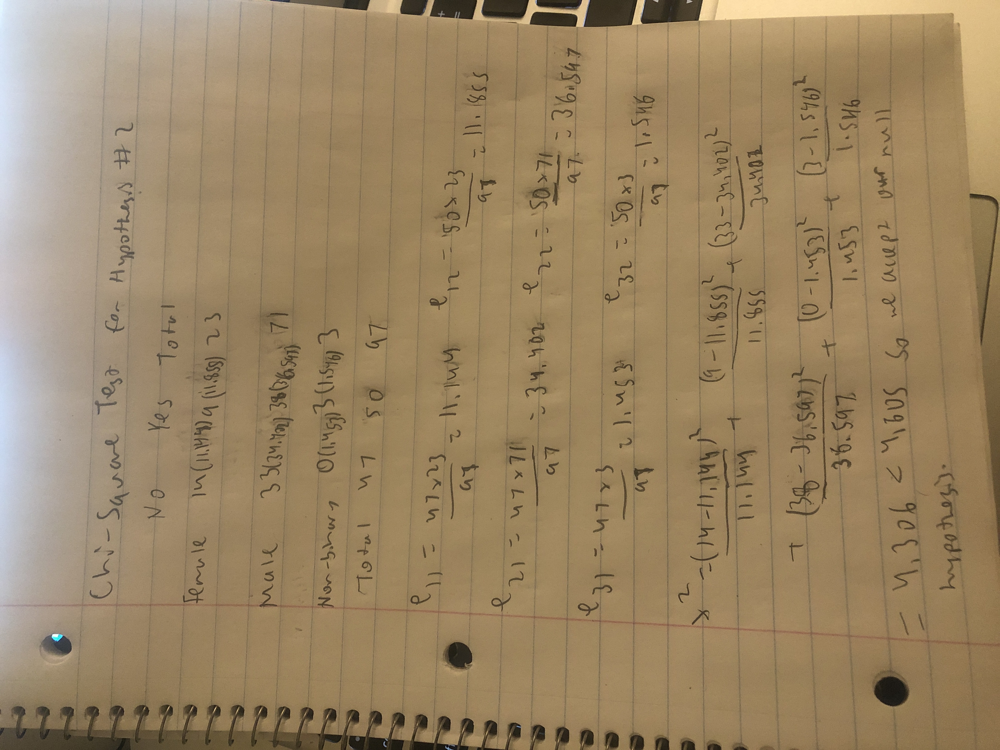

Chi-square value : 4.23687305992394
P-value : 0.5158402717104458
Degrees of freedom : 5
Expected : [[33.43298969 35.56701031]
 [ 2.42268041  2.57731959]
 [ 4.36082474  4.63917526]
 [ 0.96907216  1.03092784]
 [ 0.96907216  1.03092784]
 [ 4.84536082  5.15463918]]


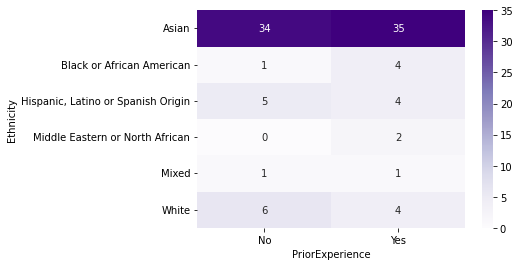

In [17]:
# third hypothesis
thirdHyp = pd.crosstab(df.Ethnicity, df.PriorExperience)
sns.heatmap(thirdHyp, annot = True, cmap = "Purples")
c, p, dof, expected = chi2_contingency(thirdHyp)
c, p, dof

print(f'Chi-square value : {c}')
print(f'P-value : {p}')
print(f'Degrees of freedom : {dof}')
print(f'Expected : {expected}')

For our degrees of freedom we get 5. Our significance level, or p-value is 0.5 which means that in order for the null hypothesis to be rejected, X^2 value must be greater than 4.351. 4.236 < 4.351 so we accept the null hypothesis. So we can conclude that prior experience with computer science is independent of a student's ethnicity.

In [18]:
X2_3 = stats.chi2_contingency(thirdHyp, correction=False)[0]
N_3 = np.sum(thirdHyp)
min_dimension_3 = min(thirdHyp.shape) - 1

cramerResult3 = np.sqrt((X2_3/N_3) / min_dimension_3)
cramerResult3

PriorExperience
No     0.300244
Yes    0.291097
dtype: float64

As we can see by the Cramer's V values, the results for both yes and no regarding prior experience is more or less equal to each other. Because these values are closer to 0, this indicates that there is little association between prior experience and the ethnicity of a student.

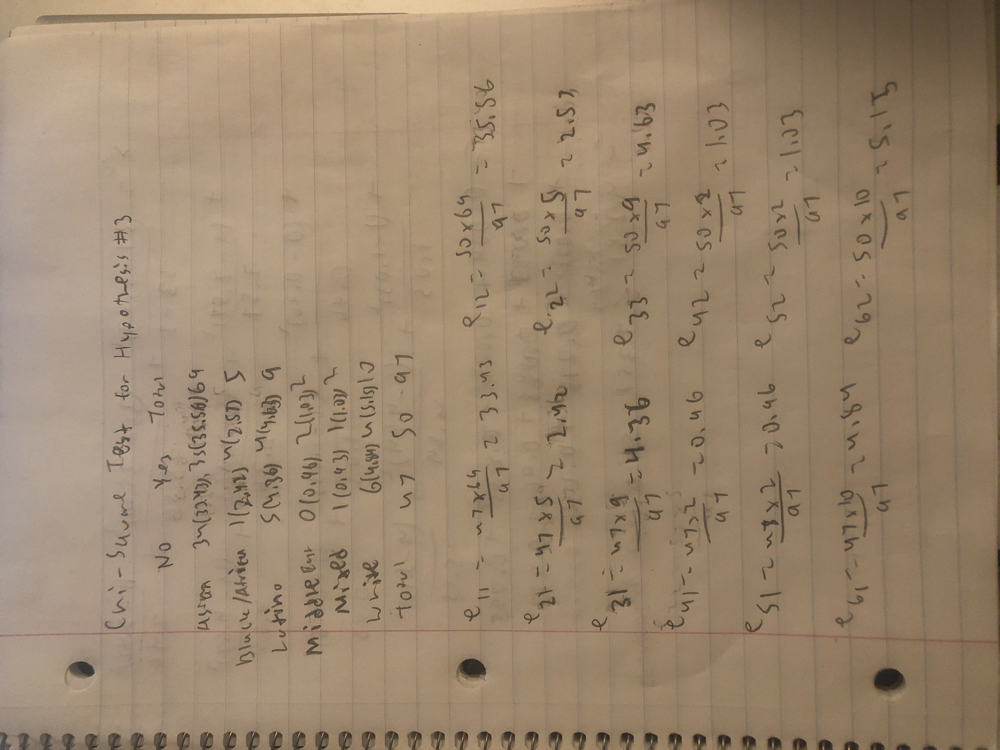

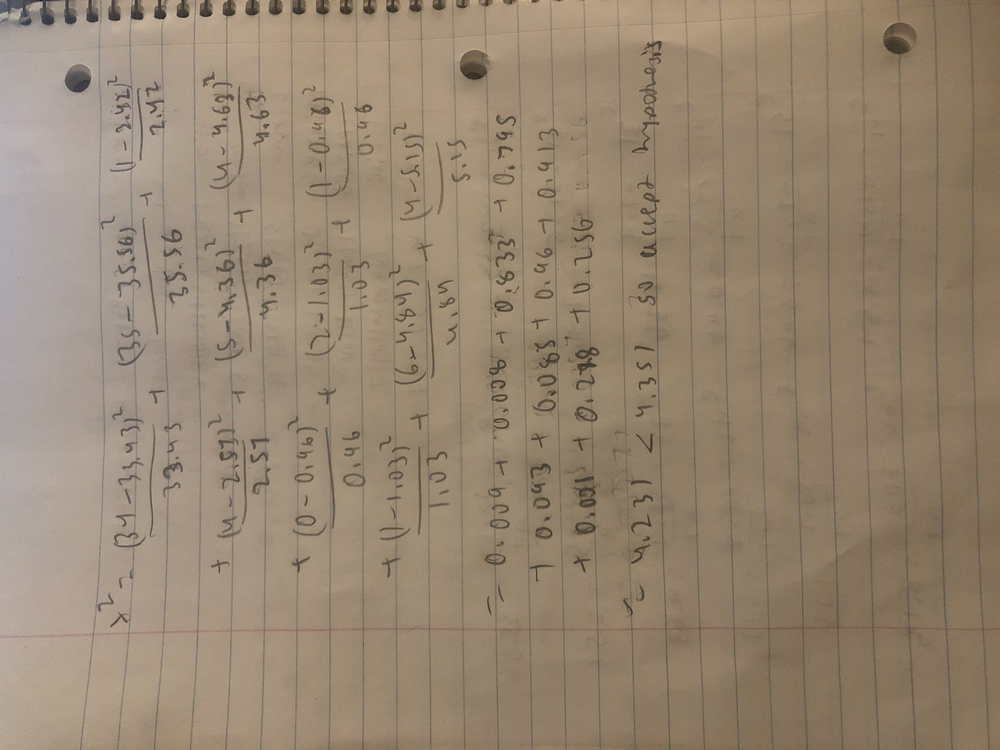